# A. Import Library and Configure Tensorflow-GPU

## A. Import Library

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2 
import tensorflow as tf

c:\Users\ivana\.conda\envs\py39\lib\site-packages\h5py\__init__.py:36: UserWarning: h5py is running against HDF5 1.14.3 when it was built against 1.14.2, this may cause problems
  _warn(("h5py is running against HDF5 {0} when it was built against {1}, "


## B. Check if Tensorflow can detect your GPU or Not

### B.1 Print NVIDIA GPUs you're using

In [2]:
!nvidia-smi

Tue Oct 29 12:07:23 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 566.03                 Driver Version: 566.03         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1050      WDDM  |   00000000:01:00.0  On |                  N/A |
| N/A   66C    P0             N/A / 5001W |     649MiB /   4096MiB |      4%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### B.2 Configure

In [3]:
memorylimitassigned = 3200
  # 3072 MB = 3GB

In [4]:
# Check if any GPUs are available
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Set memory limit for the first GPU to 3GB
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0], 
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=memorylimitassigned)]
        )
    except RuntimeError as e:
        print(e)

# C. Load dengan Ukuran Gambar yang direduksi 

In [5]:
rdctn = 224
# Enter the pixel value that is expected to be derived from the previous pixel value.
# For Example :
# 224 for 224*224 
# 448 for 448*448

## 1. Import Dataset

In [6]:
def load_images(image_paths, target_size=(rdctn, rdctn)):
    images = []
    for path in image_paths:
        img = cv2.imread(path)
        if img is not None:
            img = cv2.resize(img, target_size)
            images.append(img)
    return images


In [7]:
train_data = pd.read_csv('dataset/train_meta_df.csv')
train_images = load_images(train_data['img_file'].values)
train_labels = train_data['cat_id'].values

test_data = pd.read_csv('dataset/test_meta_df.csv')
test_images = load_images(test_data['img_file'].values)
test_labels = test_data['cat_id'].values

In [8]:
if train_images:
    train_images_array = np.array(train_images)
else:
    print("No valid training images loaded.")

if test_images:
    test_images_array = np.array(test_images)
else:
    print("No valid test images loaded.")

## 2. Data Preprocessing

### 2.1 Reshape Dataset

In [9]:
print(train_images_array.shape)


(3827, 224, 224, 3)


In [10]:
train_images = train_images_array.reshape((3827, rdctn, rdctn, 3))


In [11]:
train_images.shape

(3827, 224, 224, 3)

In [12]:
print(test_images_array.shape)

(957, 224, 224, 3)


In [13]:
test_images = test_images_array.reshape((957, rdctn, rdctn, 3))


In [14]:
test_images.shape

(957, 224, 224, 3)

In [15]:
print(train_labels.shape)

(3827,)


In [16]:
print(test_labels.shape)

(957,)


### 2.2 Normalisasi Dataset

In [17]:
train_images = train_images.astype('float32') / 255

In [18]:
test_images = test_images_array.astype('float32') / 255

### 2.3 One-Hot Encoding

In [19]:
from keras.utils import to_categorical


In [20]:
train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

In [21]:
num_classes = train_labels.shape[1]
print("Jumlah kategori unik di train_labels:", num_classes)


Jumlah kategori unik di train_labels: 60


## 3. Model Building


In [22]:
from keras import layers
from keras import models
import numpy as np

In [23]:
model = models.Sequential()

In [24]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(rdctn, rdctn, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(60, activation='softmax'))

In [25]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        36928     
                                                                 
 flatten (Flatten)           (None, 173056)           

In [26]:
model.compile(optimizer = 'rmsprop',
             loss = 'categorical_crossentropy',
             metrics = ['accuracy'])

## 4. Train Model

In [27]:
model.fit(train_images,
          train_labels,
          epochs=500,
          batch_size = 16)

Epoch 1/500
240/240 [==============================] - 23s 72ms/step - loss: 3.5298 - accuracy: 0.1505
Epoch 2/500
240/240 [==============================] - 17s 70ms/step - loss: 2.9465 - accuracy: 0.2508
Epoch 3/500
240/240 [==============================] - 17s 71ms/step - loss: 2.5611 - accuracy: 0.3384
Epoch 4/500
240/240 [==============================] - 17s 71ms/step - loss: 2.2475 - accuracy: 0.4100
Epoch 5/500
240/240 [==============================] - 17s 71ms/step - loss: 2.0328 - accuracy: 0.4547
Epoch 6/500
240/240 [==============================] - 17s 71ms/step - loss: 1.8564 - accuracy: 0.4816
Epoch 7/500
240/240 [==============================] - 17s 70ms/step - loss: 1.7426 - accuracy: 0.5059
Epoch 8/500
240/240 [==============================] - 17s 72ms/step - loss: 1.6585 - accuracy: 0.5129
Epoch 9/500
240/240 [==============================] - 17s 72ms/step - loss: 1.5838 - accuracy: 0.5226
Epoch 10/500
240/240 [==============================] - 17s 72ms/step - l

In [28]:
model.save('CNN.h5')

In [29]:
from keras.models import load_model
model = load_model('CNN.h5')

In [30]:
test_loss, test_acc = model.evaluate(test_images, test_labels)
print("test_loss : ", test_loss,"\ntest_acc : ", test_acc)

loss_224 = test_loss
test_224 = test_acc

30/30 [==============================] - 6s 52ms/step - loss: 3.9839 - accuracy: 0.2842
test_loss :  3.983938217163086 
test_acc :  0.2842215299606323


In [31]:
predictions = model.predict(test_images)

30/30 [==============================] - 1s 29ms/step


Prediksi yang salah terjadi pada iterasi ke-2


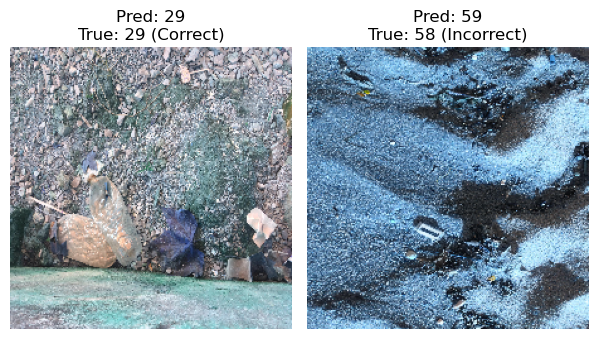

In [33]:
i = 0
correct_prediction = True
iteration_count = 0 
num_images_per_row = 5

while correct_prediction and i < len(test_images):
    plt.figure(figsize=(15, 15)) 
    
    for j in range(num_images_per_row):
        if i + j < len(test_images):  
            plt.subplot(1, num_images_per_row, j + 1)  
            plt.imshow(test_images[i + j], cmap='gray')  # Tidak perlu reshape ke (28, 28)
            plt.axis('off')  

            predicted_label = np.argmax(predictions[i + j])
            true_label = np.argmax(test_labels[i + j])

            if predicted_label == true_label:
                plt.title(f"Pred: {predicted_label}\nTrue: {true_label} (Correct)", fontsize=12)
            else:
                plt.title(f"Pred: {predicted_label}\nTrue: {true_label} (Incorrect)", fontsize=12)
                correct_prediction = False  
                
                print(f"Prediksi yang salah terjadi pada iterasi ke-{iteration_count + j + 1}")
                break
    plt.tight_layout()
    plt.show()

    i += num_images_per_row
    iteration_count += num_images_per_row  

if correct_prediction:
    print("Semua prediksi benar.")


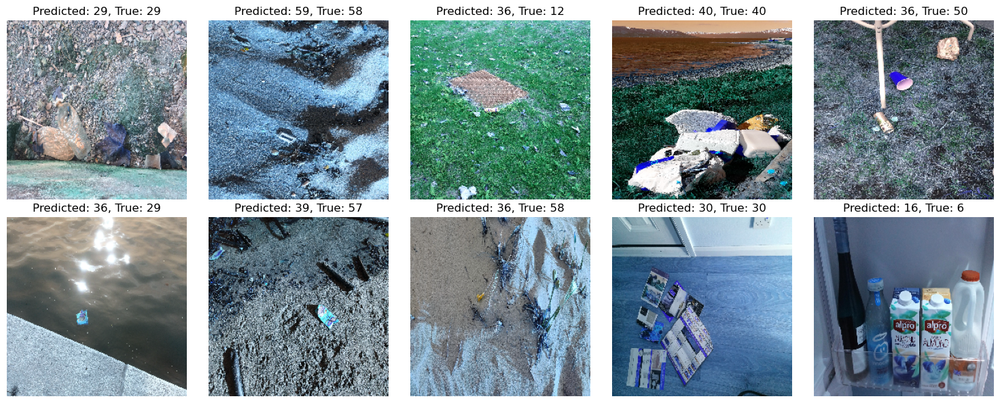

In [34]:
plt.figure(figsize=(15, 6))

for i in range(10):
    plt.subplot(2, 5, i + 1)
    
    # Display the RGB image directly without cmap
    plt.imshow(test_images[i])  # Tidak perlu cmap='gray' untuk gambar RGB
    
    plt.axis('off')
    
    predicted_label = np.argmax(predictions[i])
    true_label = np.argmax(test_labels[i])
    
    plt.title(f"Predicted: {predicted_label}, True: {true_label}", fontsize=12)

plt.tight_layout()
plt.show()


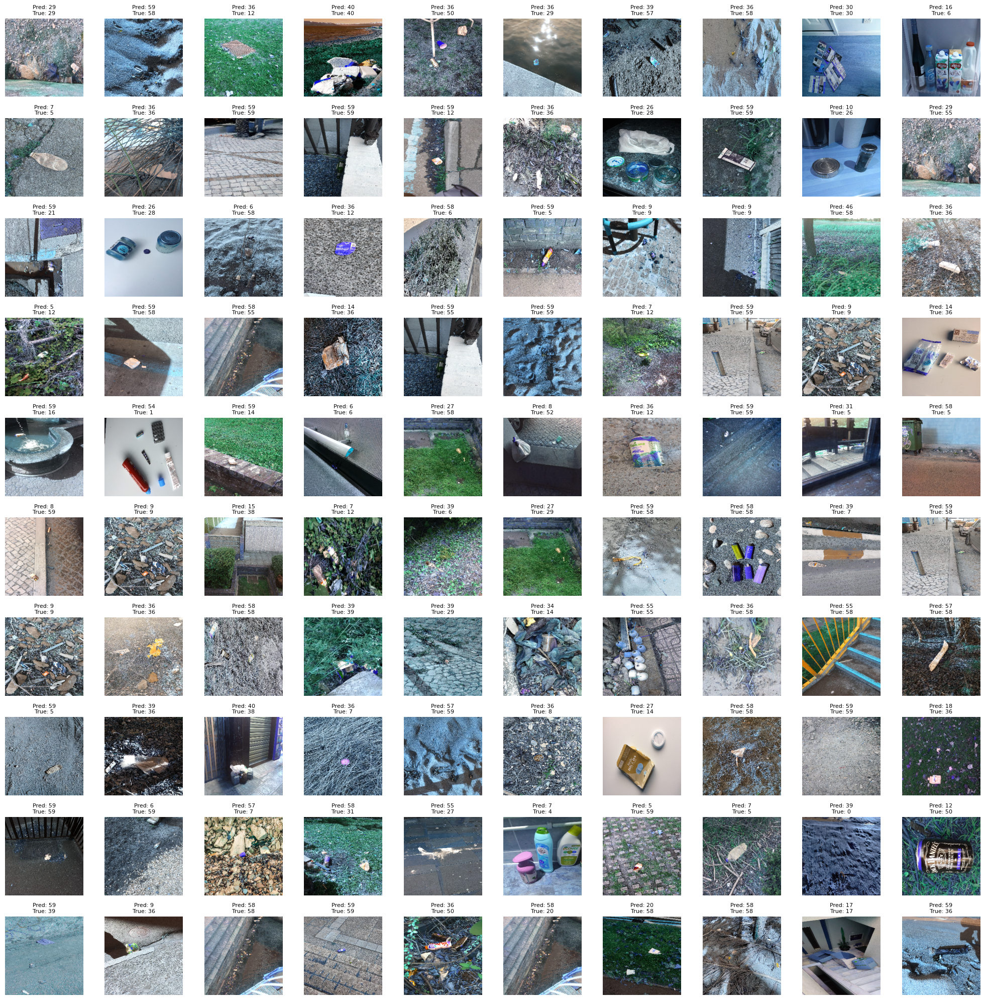

In [35]:
# Menggunakan 10 baris dan 10 kolom untuk menampilkan 100 gambar
plt.figure(figsize=(20, 20))

for i in range(100):
    plt.subplot(10, 10, i + 1)  # 10 baris dan 10 kolom
    
    # Display the RGB image directly
    plt.imshow(test_images[i])  # Tidak perlu cmap='gray'
    
    plt.axis('off')
    
    predicted_label = np.argmax(predictions[i])
    true_label = np.argmax(test_labels[i])
    
    plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=8)

plt.tight_layout()
plt.show()
